# Altair Choropleth Walkthrough

## Background
I recently completed the [Data Science Graduation Certificate program at Georgetown University](https://scs.georgetown.edu/programs/375/certificate-in-data-science/) where I led a team Capstone project that tried to determine if the District of Columbia's new dockless bikeshare pilot is impacting demand it's traditional bikeshare system, [Capital Bikeshare](https://capitalbikeshare.com).  You can learn more about my team's Capstone on our [Github](https://github.com/georgetown-analytics/DC-Bikeshare).

Being able to visualize data geographically was paramount for my team's Capstone project and after being introduced to [Altair](https://altair-viz.github.io) in my visualization course, I wanted to explore the GIS capabilites of this lesser known, but up and coming Python visualization package.

In addition to Altair's excellent [documentation](https://altair-viz.github.io) There are a good number of general Altair walkthroughs that I highly recommend you browse prior to this walkthrough, as I will be focusing soley on how to build Choropleth maps from scratch in Altair.  Below are some recommended Altair tutorials:

+ [Practical Business Python](http://pbpython.com/altair-intro.html)
+ [Analytics Vidhya](https://www.analyticsvidhya.com/blog/2017/12/introduction-to-altair-a-declarative-visualization-in-python/)
+ [Altair Notebooks](https://github.com/altair-viz/altair_notebooks)

## Required Packages

In addition to Altair, which I recommend you follow the installation instructions [here](https://altair-viz.github.io/getting_started/installation.html#installation-notebook), we'll be using the packages below for this demostration.

+ Requests - In order to pull the DC geopolitical GeoJSON from the [Open Data DC](http://opendata.dc.gov/) website. 
+ Pandas - In order to read in the cleaned DC population data that we'll add as the choropleth layer on our map
+ Geopandas - In order to join the DC population and GeoJSON data together
+ JSON - In order to convert the Geopandas dataframe into a JSON, which is required to be read by Altair.  More context on Altair Geopandas compatibility can be found [here](https://github.com/altair-viz/altair/issues/588).

A full requirements file is located my GitHub [here](https://github.com/msussman/Altair_Demo/blob/master/requirements.txt).



In [2]:
import altair as alt
import requests
import pandas as pd
import geopandas as gpd
import json

## Altair Settings

In order to render Altair plots in Jupyter Noteboook, you must enable the "alt.renderers.enable('notebook')".

If you're interested in saving your maps or any other plot as a JPEG, it's highly recommended that you also enable the 'opaque' theme, as the default Altair theme is transparent, which will cause a your JPEG to have a checkered background.

Note that while Jupyter notebook is fully supported by Altair, the developers recommend using Jupyterlab for a better experience.


In [3]:
# Set Altair theme and notebook rendering
alt.renderers.enable('notebook')
alt.themes.enable('opaque')

ThemeRegistry.enable('opaque')

## Create Baselayer of Map from GeoJSON

For this demostration we'll leverage the GeoJSON for the DC's Advisory Neighborhood Commision district as provided by Open Data DC.  There is a more recent version of this GeoJSON, but the 2000 and 2010 Census population data we'll be adding later is based on this interation of the ANC geopolitical districts.

First, I use the "download_json" function to download the ANC GeoJSON from the opendata website.  I can then pass the GeoJSON directly to Altair and mark the geoshape accordingly in order to create the base layer for my maps using the "gen_base" function.

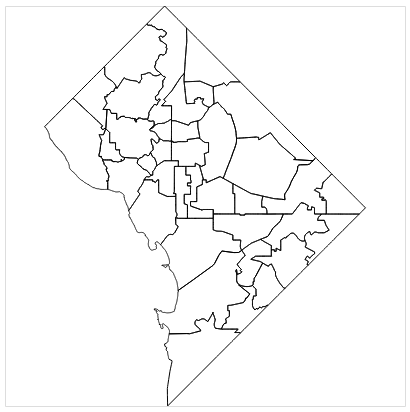

In [4]:
def download_json():
    '''Downloads ANC JSON from Open Data DC'''
    url = "https://opendata.arcgis.com/datasets/bfe6977cfd574c2b894cd67cf6a787c3_2.geojson"
    resp = requests.get(url)
    return resp.json()

def gen_base(geojson):
    '''Generates baselayer of DC ANC map'''
    base = alt.Chart(alt.Data(values=geojson)).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=400,
        height=400
    )
    return base

anc_json = download_json()
base_layer = gen_base(geojson=anc_json)
base_layer


## Convert to Geopandas Dataframe

Next, I'll convert the GeoJSON used to create the base layer of my map to a Geopandas dataframe in order to join on the population data and make some additional calculation.  Geopandas dataframe function almost exactly like standard Pandas dataframe, except they have additional functionality for geographic geometry like points and shapes.

In [6]:
# Convert GeoJSON to Geopandas Dataframe 
gdf = gpd.GeoDataFrame.from_features((anc_json))
gdf.head()

,ANC_ID,NAME,OBJECTID,SHAPE_Area,SHAPE_Length,WEB_URL,geometry
0,4C,ANC 4C,1,3.344032e+06,10341.699937,http://app.anc.dc.gov/wards.asp?ward=4&office=C,"POLYGON ((-77.02801250848198 38.9612668573881,..."
1,4D,ANC 4D,2,1.842719e+06,6421.433702,http://app.anc.dc.gov/wards.asp?ward=4&office=D,POLYGON ((-77.01787596864135 38.95766774981323...
2,1B,ANC 1B,3,2.747224e+06,7418.871696,http://app.anc.dc.gov/wards.asp?ward=1&office=B,POLYGON ((-77.01824302717323 38.92852061963107...
3,2B,ANC 2B,4,2.160268e+06,7713.349828,http://app.anc.dc.gov/wards.asp?ward=2&office=B,POLYGON ((-77.03847471278722 38.91701117992299...
4,6B,ANC 6B,5,4.899464e+06,10778.799866,http://app.anc.dc.gov/wards.asp?ward=6&office=B,POLYGON ((-77.00591806003315 38.88981961048005...


## Add Population Data to Geopandas Dataframe

Now that we have a Geopandas Dataframe, we can join on our 2000 and 2010 population data that comes from the [DC Office of Planning](https://planning.dc.gov/publication/anc-population-change-census-2000-and-2010).  This data is in PDF format, which can be extracted using Python, but to simplifly the process I've provided a CSV of this data in my [Github](https://github.com/msussman/Altair_Demo/blob/master/data/anc_population.csv), which we will read directly into a dataframe and join onto our Geopandas dataframe.

In [8]:
pop_df = pd.read_csv('../data/anc_population.csv')
gdf = gdf.merge(pop_df, on='ANC_ID', how='inner')
gdf.head()

,ANC_ID,NAME,OBJECTID,SHAPE_Area,SHAPE_Length,WEB_URL,geometry,pop_2000,pop_2010,pop_diff,pop_diff_perc
0,4C,ANC 4C,1,3.344032e+06,10341.699937,http://app.anc.dc.gov/wards.asp?ward=4&office=C,"POLYGON ((-77.02801250848198 38.9612668573881,...",19579,20330,751,0.038
1,4D,ANC 4D,2,1.842719e+06,6421.433702,http://app.anc.dc.gov/wards.asp?ward=4&office=D,POLYGON ((-77.01787596864135 38.95766774981323...,12341,12463,122,0.010
2,1B,ANC 1B,3,2.747224e+06,7418.871696,http://app.anc.dc.gov/wards.asp?ward=1&office=B,POLYGON ((-77.01824302717323 38.92852061963107...,21640,25111,"3,471",0.160
3,2B,ANC 2B,4,2.160268e+06,7713.349828,http://app.anc.dc.gov/wards.asp?ward=2&office=B,POLYGON ((-77.03847471278722 38.91701117992299...,17867,18117,249,0.014
4,6B,ANC 6B,5,4.899464e+06,10778.799866,http://app.anc.dc.gov/wards.asp?ward=6&office=B,POLYGON ((-77.00591806003315 38.88981961048005...,21364,23847,"2,483",0.116


## Determine Center of Each ANC Polygon

For my next data prep step, I'll calculate the centroid (center) of each ANC polygon in order to determine the longitude and latitude for the ANC labels I'll later add to the map.  The centroid is a method unique to Geopandas, another great reason I'm leveraging the package for this demostration.

In [9]:
gdf['centroid_lon'] = gdf['geometry'].centroid.x
gdf['centroid_lat'] = gdf['geometry'].centroid.y
gdf.head()

,ANC_ID,NAME,OBJECTID,SHAPE_Area,SHAPE_Length,WEB_URL,geometry,pop_2000,pop_2010,pop_diff,pop_diff_perc,centroid_lon,centroid_lat
0,4C,ANC 4C,1,3.344032e+06,10341.699937,http://app.anc.dc.gov/wards.asp?ward=4&office=C,"POLYGON ((-77.02801250848198 38.9612668573881,...",19579,20330,751,0.038,-77.027911,38.945261
1,4D,ANC 4D,2,1.842719e+06,6421.433702,http://app.anc.dc.gov/wards.asp?ward=4&office=D,POLYGON ((-77.01787596864135 38.95766774981323...,12341,12463,122,0.010,-77.018234,38.951656
2,1B,ANC 1B,3,2.747224e+06,7418.871696,http://app.anc.dc.gov/wards.asp?ward=1&office=B,POLYGON ((-77.01824302717323 38.92852061963107...,21640,25111,"3,471",0.160,-77.024453,38.921205
3,2B,ANC 2B,4,2.160268e+06,7713.349828,http://app.anc.dc.gov/wards.asp?ward=2&office=B,POLYGON ((-77.03847471278722 38.91701117992299...,17867,18117,249,0.014,-77.040645,38.908462
4,6B,ANC 6B,5,4.899464e+06,10778.799866,http://app.anc.dc.gov/wards.asp?ward=6&office=B,POLYGON ((-77.00591806003315 38.88981961048005...,21364,23847,"2,483",0.116,-76.987266,38.883534


## Convert Geopandas Dataframe back to GeoJSON

Now that I have all the data I need to create my map, I can convert my Geopandas dataframe back to a GeoJSON and render the features from the GeoJSON into Altair 

In [32]:
choro_json = json.loads(gdf.to_json())
choro_data = alt.Data(values=choro_json['features'])

## Add Choropleth and Label Layers to the Map

Now that I have all the data I need in a GeoJSON, I can alter my "gen_base" function from before to add all three layers to my map:

1. Base
2. Choropeth
3. ANC Labels

Now that we have the choropleth map for population from 2000 exactly how we want it.  Here are some finer items to focus on in the 'gen_map' function.

+ **Color Scheme**:  I explicitly define the color scheme 'bluegreen' as a parameter of the Scale method when encoding the Choropleth layer.  Since Altaier is built on Vega, the available color schemes are predefined by what's [available in Vega](https://vega.github.io/vega/docs/schemes/)
+ **Specifying Data Types**: In the labels layer, you can see that I'm explicitly defining the data types as quantitative ":Q" and ordinal ":O".  This is necessary because I'm passing a JSON, not a dataframe into the Altair Chart method, so the data types are unknown.  Most Altair charts you'll make can leverage a dataframe, so this step isn't generally necessary, but is a good habit to ensure you're data is in the right format.
+ **Adding Layers**: In the return statement, I'm simply using the "+" to add the layers on top of each other, which highlights the elegant simplicity that separates Altair from other visualization packages.

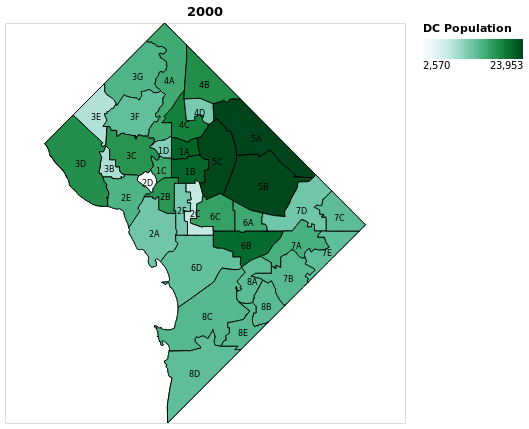

In [35]:
def gen_map(geodata, color_column, title):
    '''Generates DC ANC map with population choropleth and ANC labels'''
    # Add Base Layer
    base = alt.Chart(geodata, title = title).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=400,
        height=400
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).encode(
        alt.Color(color_column, 
                  type='quantitative', 
                  scale=alt.Scale(scheme='bluegreen'),
                  title = "DC Population")
    )
    # Add Labels Layer
    labels = alt.Chart(geodata).mark_text(baseline='top'
     ).properties(
        width=400,
        height=400
     ).encode(
         longitude='properties.centroid_lon:Q',
         latitude='properties.centroid_lat:Q',
         text='properties.ANC_ID:O',
         size=alt.value(8),
         opacity=alt.value(1)
     )

    return base + choro + labels

pop_2000_map = gen_map(geodata=choro_data, color_column='properties.pop_2000', title='2000')
pop_2000_map

## Add 2010 Population to Map

Lastly, I'll generate a second choropleth for 2010 population using the "gen_map" function and concentate the two maps into one plot.  In Altair, the | operator adds concentates two plots horizontally and the & operator  vertically.  Again, highlighting Altair's elegant simplicity.

You'll notice that by concatentating these two maps together, the color scale automatically adjusts to span both maps

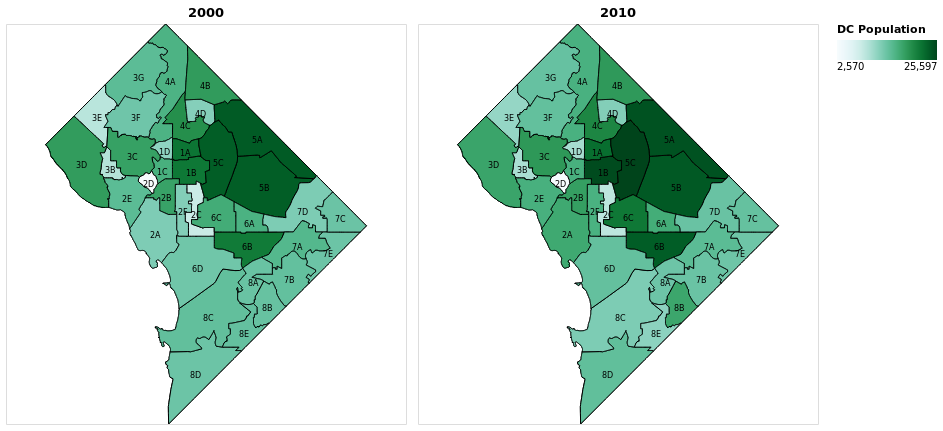

In [36]:
pop_2010_map = gen_map(geodata=choro_data, color_column='properties.pop_2010', title='2010')
pop_2000_map | pop_2010_map

## Observations on Final Maps

Now that I have the two maps side-by-side, some trends jump out immediately:

+ ANCs 5A, 5B and 5C are both the largest ANCs by size and population, which is why they were cut up during the 2013 redistricting.
+ Migration to center of the district can be seen by concentration gains ANCs 1B, 5C, 6B, and 6C
+ Wards 7 and 8 are largely losing population in both absolute and relative terms

I hope this walkthrough has peaked your interest in Altair.  You can find the notebook that this post is based on [here](https://github.com/msussman/Altair_Demo/blob/master/notebooks/Altair_Demo.ipynb)
